In [29]:
# Library Import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("darkgrid")
import pandas_profiling as ProfileReport
import plotly.graph_objs as go
import plotly.express as px
import cufflinks as cf

import warnings
warnings.filterwarnings("ignore")

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)
cf.go_offline();

# Base Model
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import label_binarize

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.svm import SVC
from sklearn.svm import LinearSVC

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.multiclass import OneVsRestClassifier

from lightgbm import LGBMClassifier

## Load Data

In [2]:
train = pd.read_csv('/content/train.csv')
test = pd.read_csv('/content/test.csv')

print('Train Shape:', train.shape)
print('*'*25)
print('Test Shape:', test.shape)

df = train.copy()

Train Shape: (2000, 21)
*************************
Test Shape: (1000, 21)


In [3]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [4]:
df.shape

(2000, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

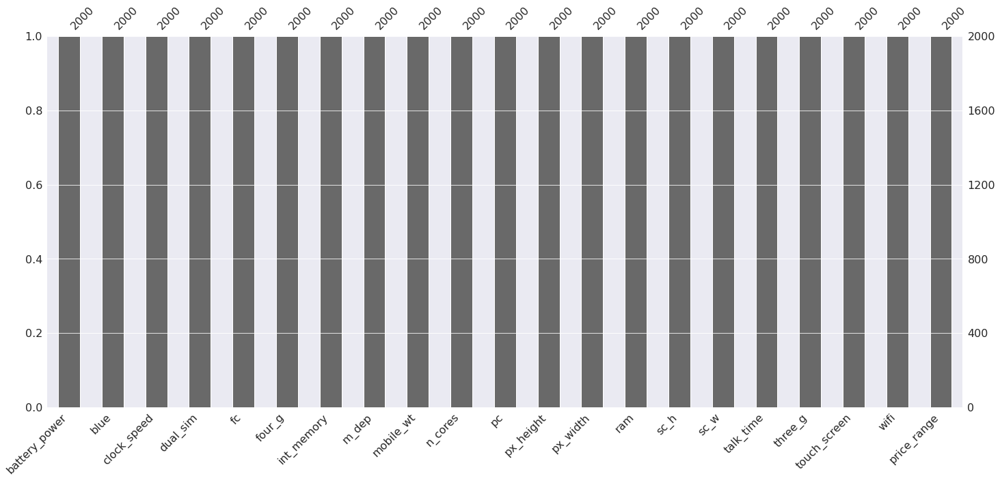

In [11]:
import missingno as msno
msno.bar(df)
plt.show()

**We haven't any missing value :)**

In [6]:
# pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [8]:
df.profile_report()

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Analysis

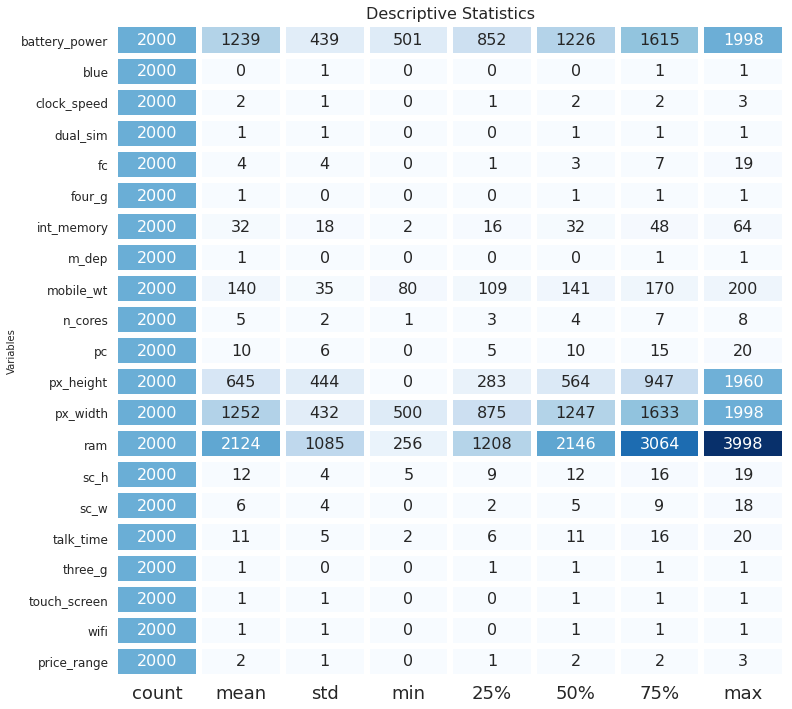

In [10]:
desc = df.describe().T
df1 = pd.DataFrame(index=['battery_power', 'blue', 'clock_speed', 'dual_sim',
                          'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 
                          'n_cores', 'pc', 'px_height', 'px_width', 'ram', 
                          'sc_h', 'sc_w', 'talk_time', 'three_g','touch_screen',
                          'wifi', 'price_range'], 
                   columns= ["count","mean","std","min",
                             "25%","50%","75%","max"], data= desc )

f,ax = plt.subplots(figsize=(12,12))

sns.heatmap(df1, annot=True,cmap = "Blues", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

plt.xticks(size = 18)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("Variables")
plt.title("Descriptive Statistics", size = 16)
plt.show()

Text(0.5, 1.0, 'Correlations')

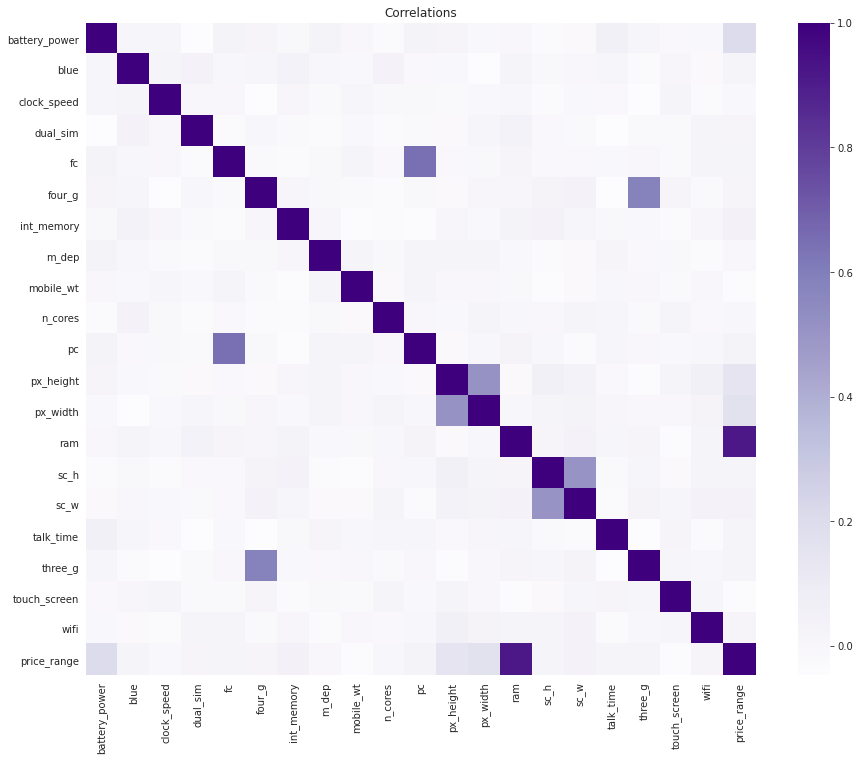

In [12]:
# Correlations

corr=df.corr()
fig = plt.figure(figsize=(15,12))
r = sns.heatmap(corr, cmap='Purples')
r.set_title('Correlations')

In [13]:
# price range correlations

corr.sort_values(by=['price_range'],ascending=False).iloc[0].sort_values(ascending=False)

price_range      1.000000
ram              0.917046
battery_power    0.200723
px_width         0.165818
px_height        0.148858
int_memory       0.044435
sc_w             0.038711
pc               0.033599
three_g          0.023611
sc_h             0.022986
fc               0.021998
talk_time        0.021859
blue             0.020573
wifi             0.018785
dual_sim         0.017444
four_g           0.014772
n_cores          0.004399
m_dep            0.000853
clock_speed     -0.006606
mobile_wt       -0.030302
touch_screen    -0.030411
Name: price_range, dtype: float64

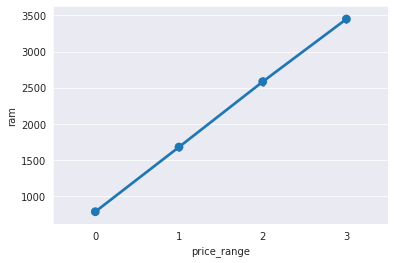

In [17]:
#Ram vs Price Range
sns.pointplot(y='ram',x='price_range',data=df);

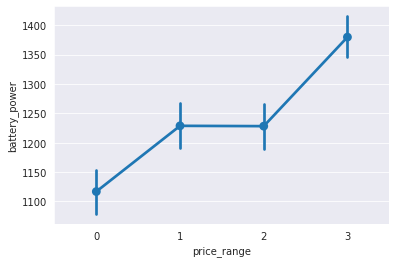

In [21]:
#Battery Power vs Price Range
sns.pointplot(y='battery_power',x='price_range',data=df);

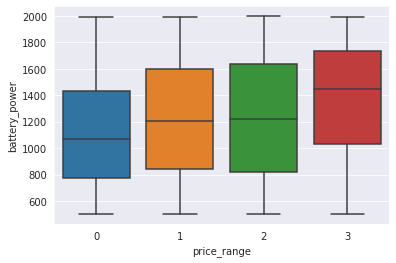

In [22]:
sns.boxplot(x='price_range', y='battery_power',data=df)

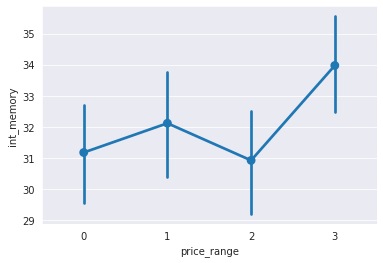

In [18]:
#Int Memory vs Price Range
sns.pointplot(y='int_memory',x='price_range',data=df);

## X and Y

In [26]:
X = df.drop('price_range',axis=1)
y = df['price_range']

## Splitting of Test and Train Data

In [27]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.33,random_state=42)

# Creating and Training Model

## 1) Linear Regression

In [34]:
lrm = LinearRegression()
lrm.fit(X_train,y_train)
lrm.score(X_test,y_test)

0.9190369530612718

## 2) KNN

In [85]:
knnm = KNeighborsClassifier(n_neighbors=10)
knnm.fit(X_train,y_train)
knnm.score(X_test,y_test)
print(classification_report(y_test,y_knn_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       169
           1       0.90      0.96      0.93       162
           2       0.89      0.87      0.88       162
           3       0.97      0.92      0.94       167

    accuracy                           0.93       660
   macro avg       0.93      0.93      0.93       660
weighted avg       0.93      0.93      0.93       660



## 3) Logistic Regression

In [39]:
logm = LogisticRegression()
logm.fit(X_train,y_train)
logm.score(X_test,y_test)

0.6378787878787879

## 4) Decision Tree

In [42]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
dtc.score(X_test,y_test)

0.8196969696969697

## 5) Random Forest Classifier

In [44]:
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
rf.score(X_test,y_test)

0.8909090909090909

## 6) LGBM Classifier

In [46]:
lgbmc = LGBMClassifier(random_state = 42)
lgbmc.fit(X_train,y_train)
lgbmc.score(X_test,y_test)

0.896969696969697

## 7) SVM Classifier

              precision    recall  f1-score   support

           0       0.98      0.97      0.98       169
           1       0.92      0.98      0.95       162
           2       0.94      0.91      0.92       162
           3       0.96      0.95      0.96       167

    accuracy                           0.95       660
   macro avg       0.95      0.95      0.95       660
weighted avg       0.95      0.95      0.95       660



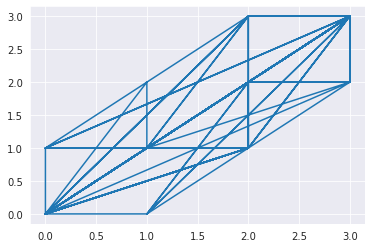

In [105]:
svmcm = SVC()
svmcm.fit(X_train,y_train)
svmcm.score(X_test,y_test)
y_svmcm_pred = svmcm.predict(X_test)
print(classification_report(y_test,y_svmcm_pred))
plt.plot(y_test,y_svmcm_pred)

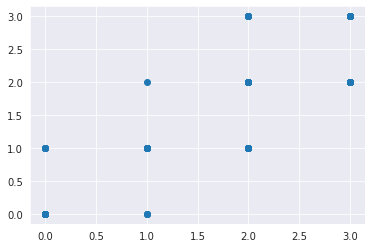

In [107]:
plt.scatter(y_test,y_svmcm_pred)

In [110]:
val=confusion_matrix(y_test,y_svmcm_pred)
print(val)

[[164   5   0   0]
 [  3 158   1   0]
 [  0   9 147   6]
 [  0   0   8 159]]


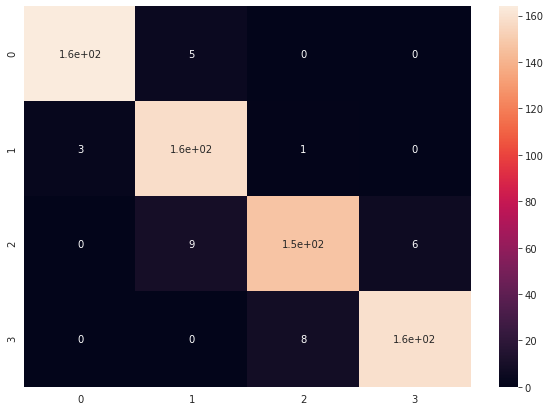

In [137]:
plt.figure(figsize = (10,7))
sns.heatmap(val,annot=True)

## Classification of test.csv

In [113]:
df_test = pd.read_csv('test.csv')
df_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1


In [117]:
# df_test.drop('id',axis=1,inplace=True)
df_test.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1


In [ ]:
# pred_svmcm = svmcm.predict(df_test)
# pred_svmcm

In [122]:
df_test['price_range'] = pred_svmcm

In [123]:
df_test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0,3
1,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1,2
3,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,17,644,913,2121,14,8,15,1,1,0,2
996,609,0,1.8,1,0,0,13,0.9,186,4,2,1152,1632,1933,8,1,19,0,1,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,12,477,825,1223,5,0,14,1,0,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,12,38,832,2509,15,11,6,0,1,0,2


In [129]:
X = df_test.drop('price_range',axis=1)
y = df_test['price_range']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.33,random_state=42)

svmcm_t = SVC()
svmcm_t.fit(X_train,y_train)
svmcm_t.score(X_test,y_test)

0.9818181818181818

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        80
           1       0.99      0.94      0.96        71
           2       0.97      0.99      0.98        79
           3       1.00      0.99      0.99       100

    accuracy                           0.98       330
   macro avg       0.98      0.98      0.98       330
weighted avg       0.98      0.98      0.98       330



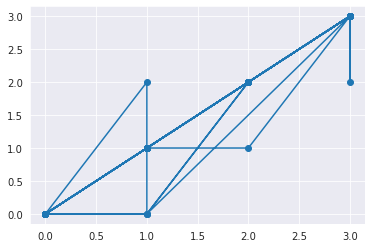

In [132]:
y_svmcm_t_pred = svmcm_t.predict(X_test)
print(classification_report(y_test,y_svmcm_t_pred))
plt.plot(y_test,y_svmcm_t_pred)
plt.scatter(y_test,y_svmcm_t_pred)

In [136]:
df_test['price_range'].to_csv('submission.csv')